## Практикум, ММП ВМК МГУ

## Семинар 4

## `openCV` и обработка изображений

### Автор: Оганов Александр

*часть материалов взята из [ноутбука Ярослава Морозова](https://github.com/mmp-practicum-team/mmp_practicum_fall_2022/blob/main/Seminars/04-image-processing-and-KNN/ImagesPython.ipynb)*

In [1]:
from PIL import Image
import cv2 as cv

import numpy as np
import matplotlib.pyplot as plt
import skimage.io
import skimage.color
import skimage.transform
import scipy.ndimage
import PIL
%matplotlib inline

In [2]:
!wget http://pm1.narvii.com/7354/68e873fd4a92810b38ae2dc639115f4842f80400r1-1200-900v2_uhq.jpg
!mv 68e873fd4a92810b38ae2dc639115f4842f80400r1-1200-900v2_uhq.jpg cat.jpg

--2023-09-28 10:45:24--  http://pm1.narvii.com/7354/68e873fd4a92810b38ae2dc639115f4842f80400r1-1200-900v2_uhq.jpg
Распознаётся pm1.narvii.com (pm1.narvii.com)… 151.101.244.193
Подключение к pm1.narvii.com (pm1.narvii.com)|151.101.244.193|:80... соединение установлено.
HTTP-запрос отправлен. Ожидание ответа… 200 OK
Длина: 129361 (126K) [image/jpeg]
Сохранение в: «68e873fd4a92810b38ae2dc639115f4842f80400r1-1200-900v2_uhq.jpg»

68e873fd4a92810b38a 100%[===================>] 126,33K  --.-KB/s    за 0,04s   

2023-09-28 10:45:24 (3,10 MB/s) - «68e873fd4a92810b38ae2dc639115f4842f80400r1-1200-900v2_uhq.jpg» сохранён [129361/129361]



# Загрузка изображений

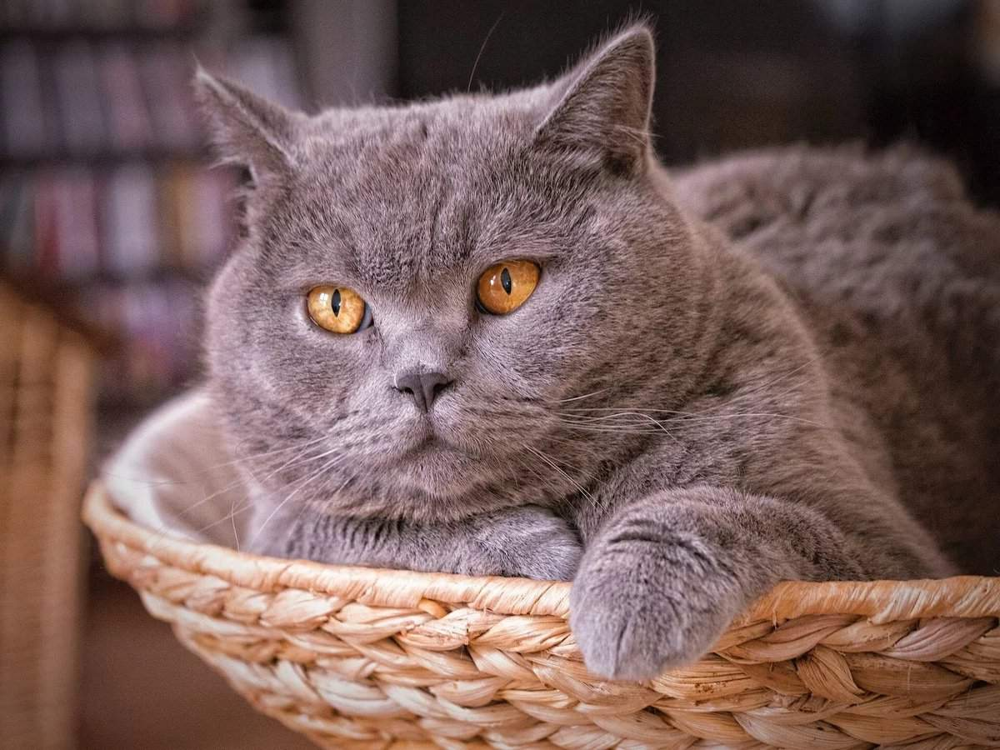

In [3]:
cat_image = PIL.Image.open('cat.jpg')
cat_image

In [4]:
cat_image.format, cat_image.size, cat_image.mode

('JPEG', (1200, 900), 'RGB')

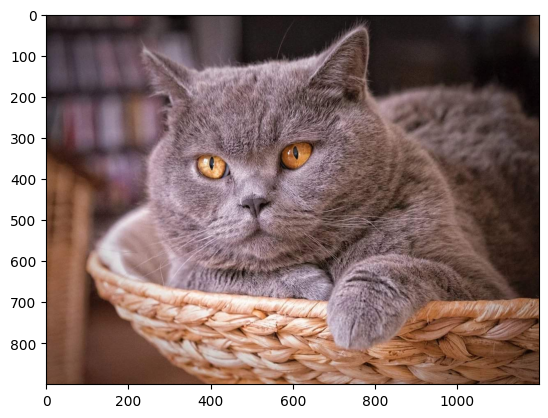

In [5]:
cat_array = np.array(cat_image)
plt.imshow(cat_array)

Также можно сразу получить изображение в виде тензора используя библиотеки matplotlib или skimage

In [6]:
skimage_array = skimage.io.imread('cat.jpg')
np.testing.assert_almost_equal(cat_array, skimage_array)

plt_array = plt.imread('cat.jpg')
np.testing.assert_almost_equal(cat_array, plt_array)

In [7]:
cat_array.shape # HxWxC

(900, 1200, 3)

Каждое цветное изображение - трехканальный тензор

# Трансформации изображений

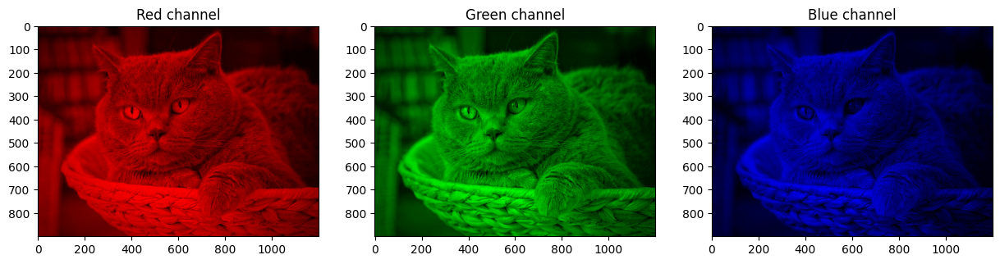

In [8]:
plt.figure(figsize=(15, 10))

titles = ['Red channel', 'Green channel', 'Blue channel']
for i in range(3):
    plt.subplot(1, 3, i + 1)
    zeros = np.zeros_like(cat_array)
    zeros[:, :, i] = cat_array[:, :, i]
    plt.imshow(zeros)
    plt.title(titles[i])

plt.show()

Изображения необязательно могут быть цветными, также они могут быть бинарными или в серых тонах

Формула для получения изображения в серых тонах:

$$ Y = 0.299R + 0.587G + 0.114B $$

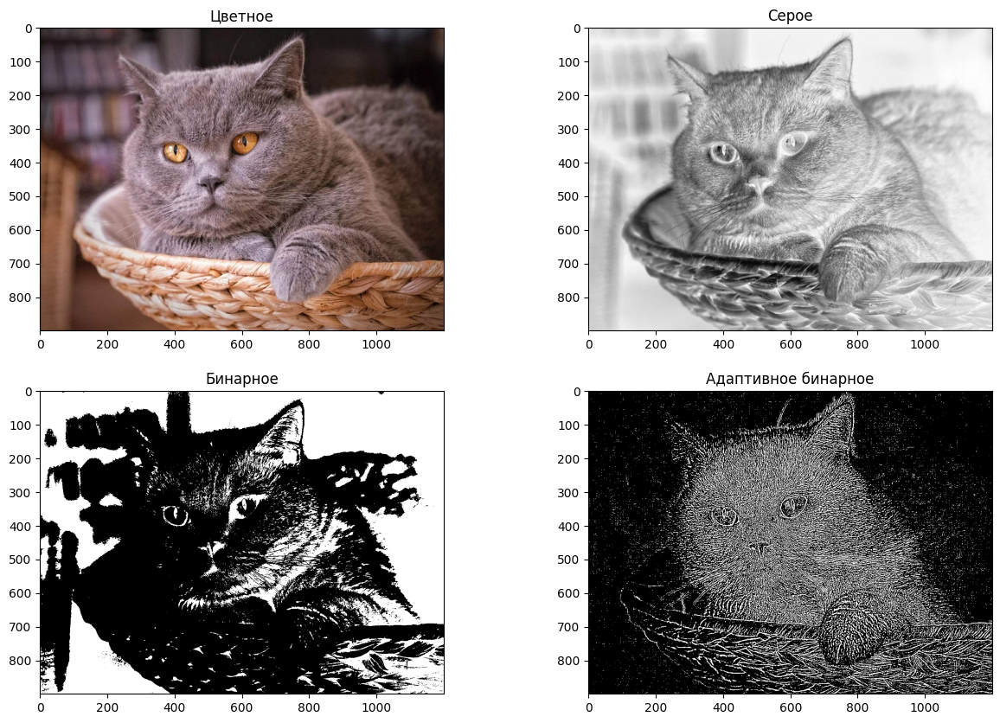

In [9]:
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
plt.title('Цветное')
plt.imshow(cat_array)

plt.subplot(2, 2, 2)
plt.title('Серое')
gray_image = cv.cvtColor(cat_array, cv.COLOR_BGR2GRAY)
plt.imshow(gray_image, cmap=plt.cm.Greys)

plt.subplot(2, 2, 3)
thresh, bin_image = cv.threshold(gray_image, 75, 75, cv.THRESH_BINARY)
plt.title('Бинарное')
plt.imshow(bin_image, cmap=plt.cm.Greys)

plt.subplot(2, 2, 4)
adaptive_bin_image = cv.adaptiveThreshold(gray_image, 255, cv.ADAPTIVE_THRESH_MEAN_C, 
                                         cv.THRESH_BINARY, 5, 5)
plt.title('Адаптивное бинарное')
plt.imshow(adaptive_bin_image, cmap=plt.cm.Greys)

plt.show()

Бинаризация бывает:


*   Глобальная (один порог для всех пикселей на фото)
*   Локальная (порог зависит от положения пикселя)
*   Адаптивная (порог зависит от положения и от яркости пикселя)



## HSV представление

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/3/33/HSV_color_solid_cylinder_saturation_gray.png/1280px-HSV_color_solid_cylinder_saturation_gray.png" width="500">

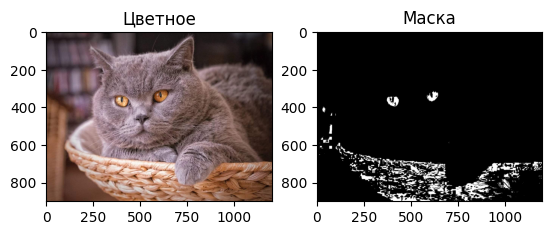

In [10]:
hsv_cat = cv.cvtColor(cat_array, cv.COLOR_RGB2HSV)

lower_blue = np.array([11, 0, 150])
upper_blue = np.array([16, 250, 255])
mask = cv.inRange(hsv_cat, lower_blue, upper_blue)

plt.subplot(1, 2, 1)
plt.title("Цветное")
plt.imshow(cat_array)

plt.subplot(1, 2, 2)
plt.title("Маска")
plt.imshow(np.uint(mask), cmap='gray')

plt.show()

## Геометрические преобразования

Изображения можно поворачить, сдвигать и тд по своему желанию

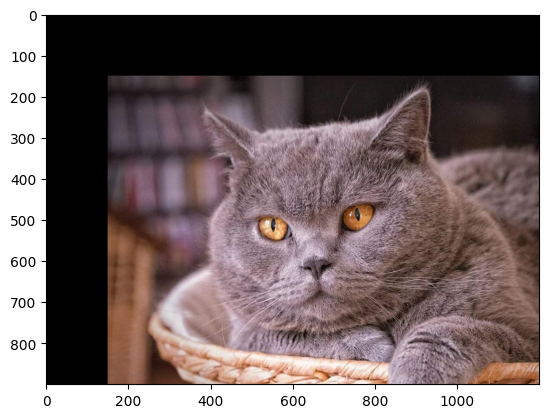

In [11]:
shifted_image = scipy.ndimage.shift(cat_array, [150, 150, 0])
plt.imshow(shifted_image)
plt.show()

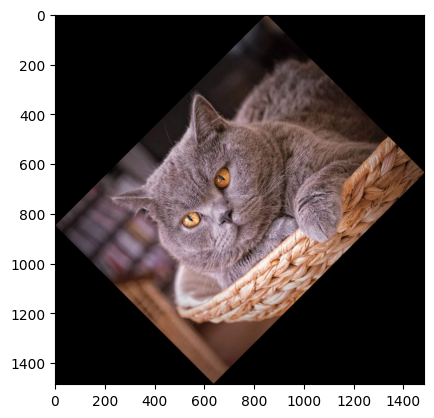

In [12]:
rotated_image = scipy.ndimage.rotate(cat_array, 45)
plt.imshow(rotated_image)
plt.show()

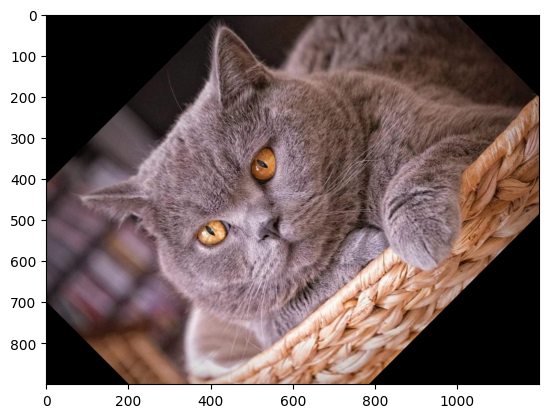

In [13]:
rotated_image = skimage.transform.rotate(cat_array, 45) # with resize=True equal to scipy.rotate 
plt.imshow(rotated_image)
plt.show()

In [14]:
def very_smart_augmentation(image_array, a, b):
    angle = np.random.randint(-b, b, 1)[0]
    shift_x, shift_y = np.random.randint(-a, a, 2)
    img = scipy.ndimage.shift(image_array, [shift_y, shift_x, 0])
    img = skimage.transform.rotate(img, angle)
    return img

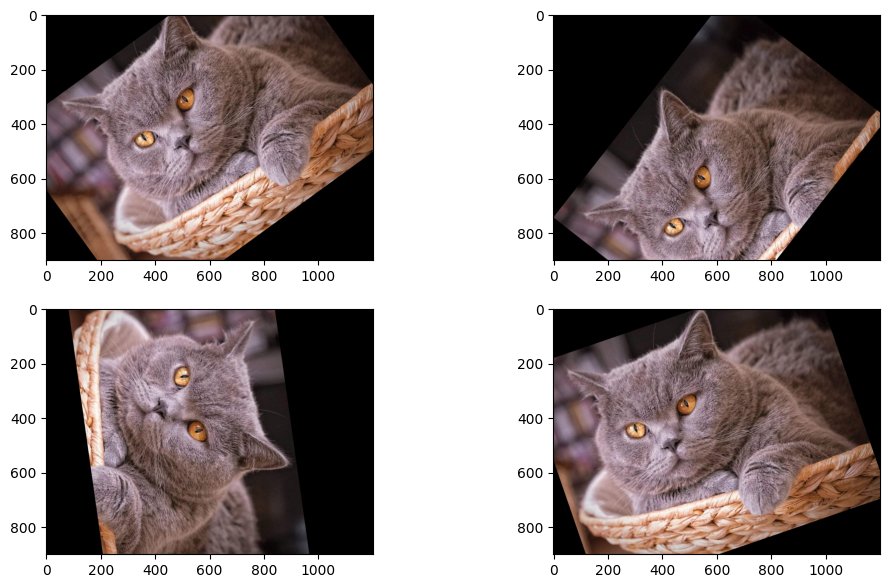

In [15]:
assert (very_smart_augmentation(cat_array, 200, 90) != cat_array).any(), "Maybe it's just chance 1e-1051251025105, but I think your code is wrong" 

a = 200
b = 90

plt.figure(figsize=(12, 7))

for i in range(4):
    plt.subplot(2, 2, i + 1)
    plt.imshow(very_smart_augmentation(cat_array, a, b))
plt.show()

## Фильтры

(Более подробно про эту сущность вы узнаете в следующем семестре на курсе ОиРИ и DL)

<img src="https://raw.githubusercontent.com/Yar4ik000/mmp_practicum_fall_2021/main/Seminars/Seminar%2004.%20Image%20processing%20and%20KNN/image_processing_src/images/sorting-median.png">

Данный фильтр называется медианным. С его помощью можно удалять шумы с фото

In [16]:
!wget https://turkmenportal.com/images/uploads/blogs/b1cec01f147f463a30d6ecb03fb74900.jpg
!mv b1cec01f147f463a30d6ecb03fb74900.jpg msu.jpg
msu_array = skimage.io.imread('msu.jpg')
msu_gray = cv.cvtColor(msu_array, cv.COLOR_BGR2GRAY)

--2023-09-28 10:45:37--  https://turkmenportal.com/images/uploads/blogs/b1cec01f147f463a30d6ecb03fb74900.jpg
Распознаётся turkmenportal.com (turkmenportal.com)… 95.85.126.182
Подключение к turkmenportal.com (turkmenportal.com)|95.85.126.182|:443... соединение установлено.
HTTP-запрос отправлен. Ожидание ответа… 200 OK
Длина: 241934 (236K) [image/jpeg]
Сохранение в: «b1cec01f147f463a30d6ecb03fb74900.jpg»

b1cec01f147f463a30d 100%[===================>] 236,26K  1,26MB/s    за 0,2s    

2023-09-28 10:45:38 (1,26 MB/s) - «b1cec01f147f463a30d6ecb03fb74900.jpg» сохранён [241934/241934]



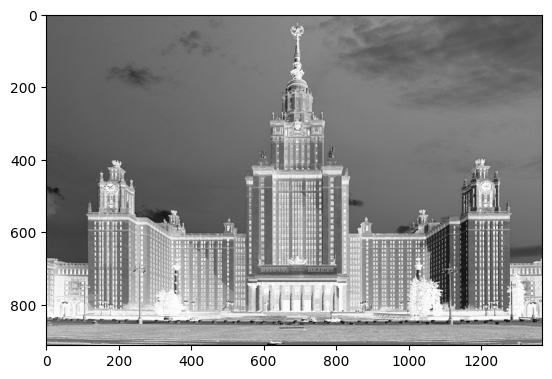

In [17]:
plt.imshow(msu_gray, cmap=plt.cm.Greys)
plt.show()

Создайте случайный шумовые точки и добавьте их в картинку копию. После чего используйте медианный фильтр (scipy.ndimage.median_filter), чтобы исправить картинку любимого вуза

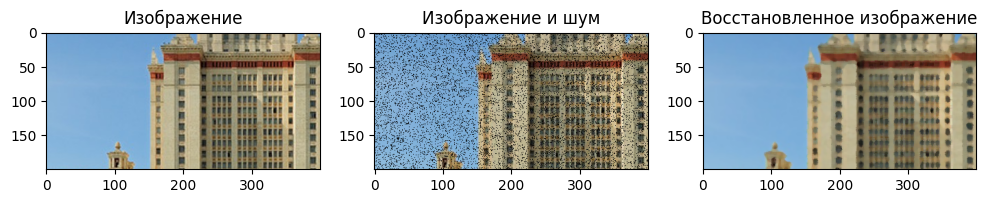

In [18]:
img_copy = msu_array[400:600, 400:800].copy()
noise_x = np.random.choice(img_copy.shape[1], size=10000)
noise_y = np.random.choice(img_copy.shape[0], size=10000)

plt.figure(figsize=(12, 7))

plt.subplot(1, 3, 1)
plt.imshow(img_copy)
plt.title("Изображение")

img_copy[noise_y, noise_x, :] = 0
plt.subplot(1, 3, 2)
plt.imshow(img_copy)
plt.title("Изображение и шум")

plt.subplot(1, 3, 3)
msu_filtered = cv.medianBlur(img_copy, 5)
plt.imshow(msu_filtered)
plt.title("Восстановленное изображение")
plt.show()

Пример применения гауссовского фильтра, позволяющего размыть фото.
$$ Y[i, j] = \sum_{l = -k}^k \sum_{m = -k}^k X[i + l, j + m] \frac{1}{\sqrt{2 \pi \sigma}} \exp\left(-\frac{\sqrt{l^2 + m^2}}{2\sigma^2}\right)
 $$

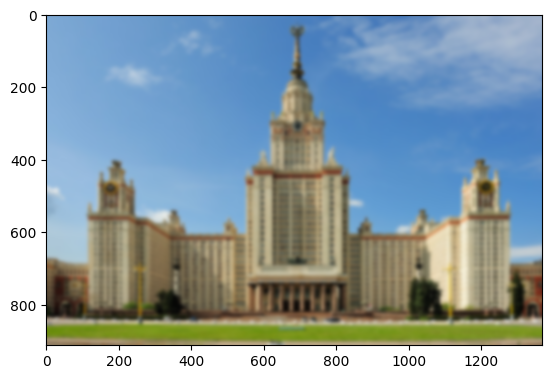

In [19]:
blured_msu = cv.GaussianBlur(msu_array, (25, 25), 5)
plt.imshow(blured_msu)
plt.show()

Выделение контуров изображения с помощью фильтров

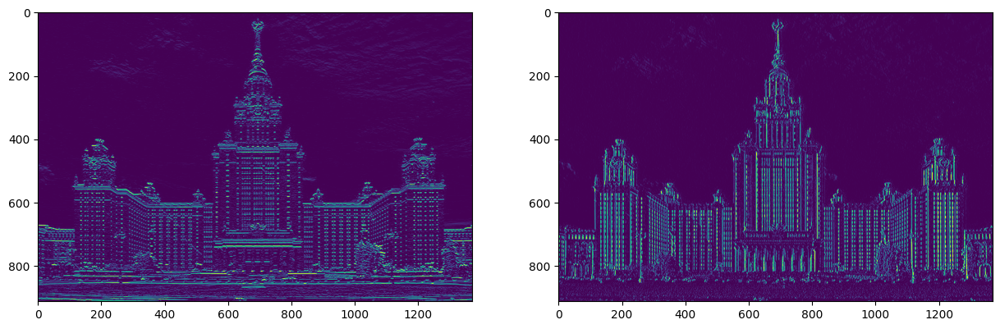

In [20]:
plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
kernel = np.array([[1, 2, 1], 
                   [0, 0, 0],
                   [-1, -2, -1]])
msu_horizontal = cv.filter2D(msu_gray, 0, kernel)
plt.imshow(msu_horizontal)

plt.subplot(1, 2, 2)
kernel = np.array([[1, 0, -1], 
                   [2, 0, -2],
                   [1, 0, -1]])
msu_vertical = cv.filter2D(msu_gray, 0, kernel)
plt.imshow(msu_vertical)
plt.show()

## SVD

[Сайт c демонстрацией](http://timbaumann.info/svd-image-compression-demo/)

Пусть $A \in \mathbb{R}^{m \times n}$, тогда SVD разложение $A$ записывается в следующем виде:

$$ A = U \Sigma V^{*}, ~ U \in R^{m \times m}, ~ \Sigma \in R^{m \times n}, ~V \in R^{n \times n}$$
$$ UU^{*} = I_m, ~V^{*}V=I_n $$

Какие хорошие свойства SVD вы знаете?

$\textbf{Псевдообратная матрица}$

$A^\dagger = V\Sigma^{-1} U^{*}$ или же...

$$ A^\dagger = \lim_{\lambda \to +0} (A^{*}A + \lambda I)^{-1}A^*$$

Чем-то напоминает решение линейной регрессии...

Какой смысл у псевдообратный матрицы?

$Aw = y$, то $\hat{w} := A^\dagger y~$ соответсвует $argmin_{w} \| Aw - y\|_2$, причем если решений бесонечно много, то $\hat{w}$ имеет наименьшую норму

[Псевдообратная матрица](https://ru.wikipedia.org/wiki/%D0%9F%D1%81%D0%B5%D0%B2%D0%B4%D0%BE%D0%BE%D0%B1%D1%80%D0%B0%D1%82%D0%BD%D0%B0%D1%8F_%D0%BC%D0%B0%D1%82%D1%80%D0%B8%D1%86%D0%B0)

[Связь с линейной регрессией](https://ds12.github.io/talks/lectures/lecture4.html#slide1)

$\textbf{Малоранговое приближение}$

Пусть $A \in \mathbb{R}^{m \times n}$, назовем $$A_k = U_k \Sigma_k V^{*}_k, ~ U_k = U[:, :k], ~ \Sigma_k = \Sigma[:k, :k], ~V_k = V[:k, :]$$

Из курса линейной алгебры известно

$$ A_k = argmin_{B \in \mathbb{R}^{m \times n}, rank(B) = k} \|A - B \|_F $$

Что такое $\| \|_F$? Чему равно $\|A - A_k \|_F$?

In [21]:
def trunc_svd(A, k):
    U, S, Vh = np.linalg.svd(A, full_matrices=False)
    return U[:, :k + 1], S[:k + 1],  Vh[:k + 1]

In [22]:
k = 20
c = 0
A = np.copy(msu_array)
A_c = A[:, :, c]
_, sing_vals, _ = np.linalg.svd(A_c)

U, S, Vh = trunc_svd(A_c, k)
A_k = U @ np.diag(S) @ Vh

assert abs(np.linalg.norm(A_c - A_k) - np.linalg.norm(sing_vals[k + 1:])) < 1e-5

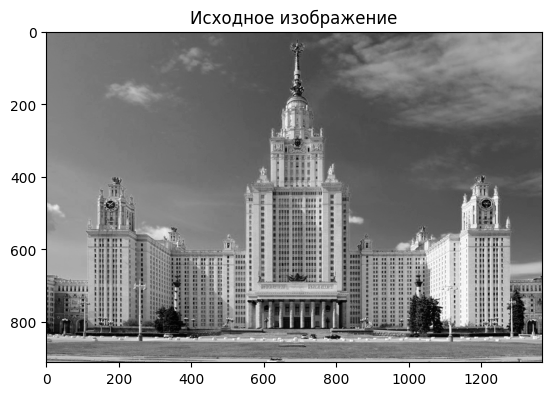

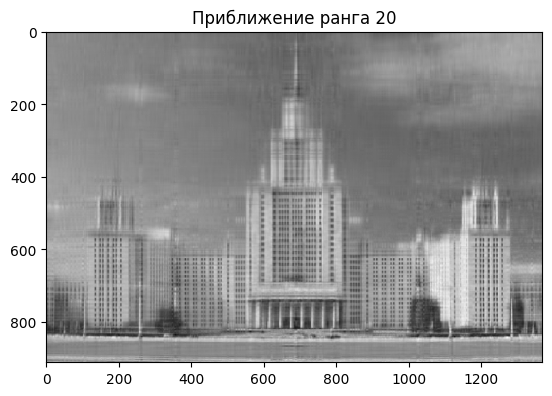

In [23]:
plt.imshow(A_c, cmap="gray")
plt.title("Исходное изображение")
plt.show()

plt.imshow(A_k, cmap="gray")
plt.title(f"Приближение ранга {k}")
plt.show()

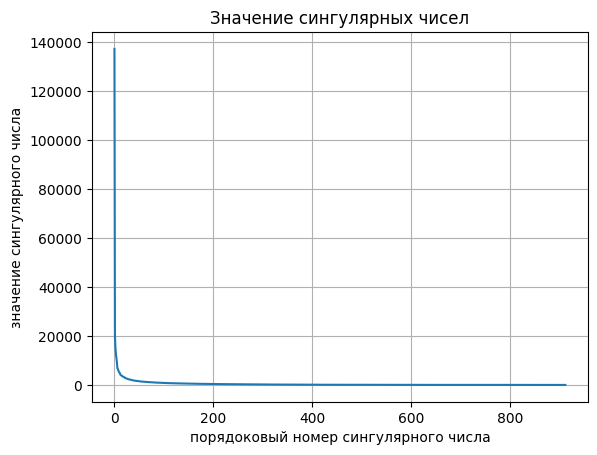

In [24]:
plt.title("Значение сингулярных чисел")
plt.plot(sing_vals)
plt.grid()
plt.xlabel("порядоковый номер сингулярного числа")
plt.ylabel("значение сингулярного числа")
plt.show()

rank(A[:, :, 0]) = 912
rank(A[:, :, 1]) = 912
rank(A[:, :, 2]) = 912


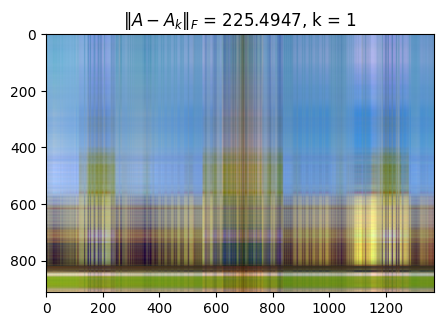

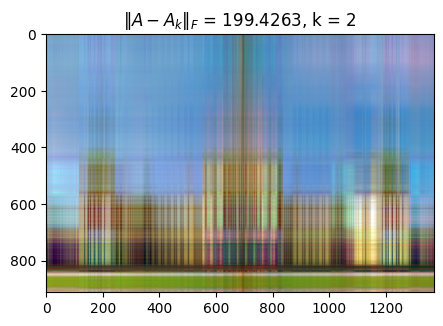

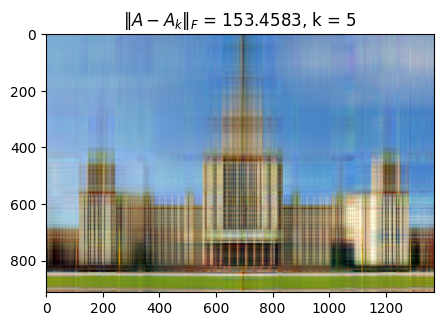

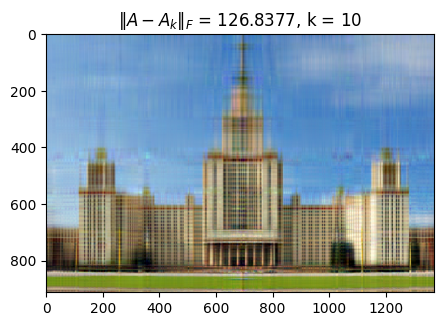

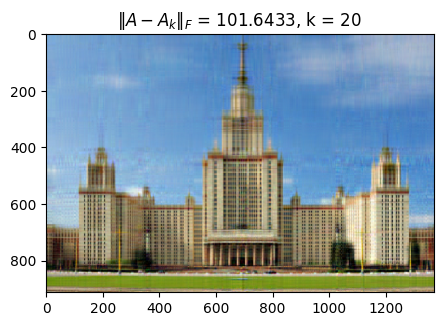

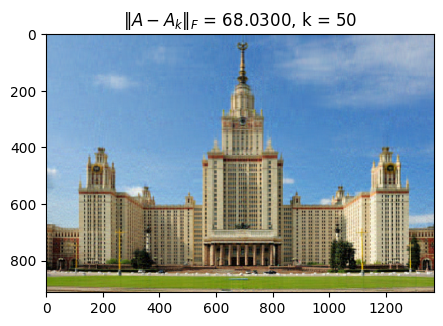

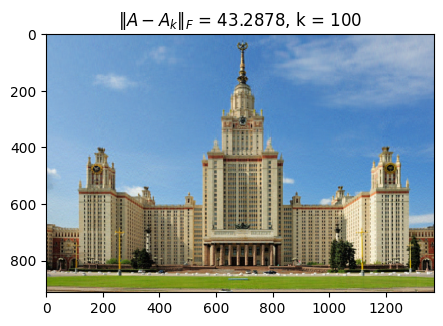

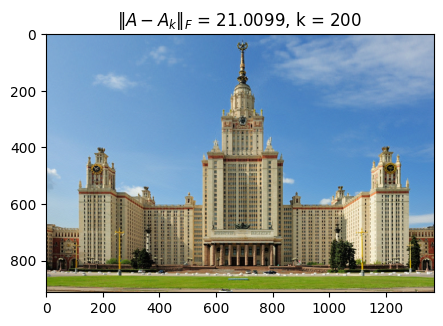

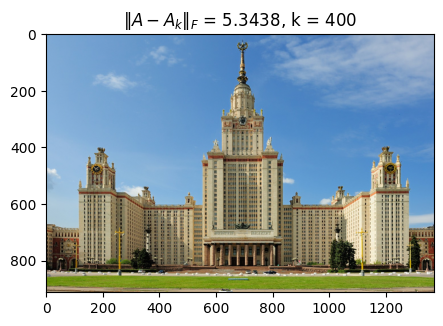

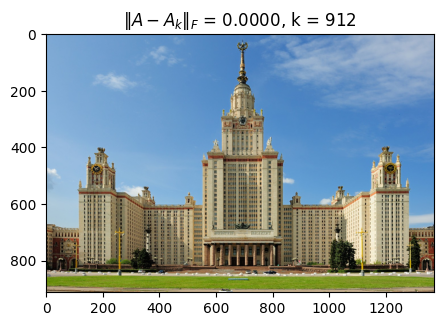

In [25]:
for i in range(3):
    r = np.linalg.matrix_rank(A[:, :, i])
    print(f"rank(A[:, :, {i}]) = {r}")


k_grid = [1, 2, 5, 10, 20, 50, 100, 200, 400, 912]
A = msu_array.copy() / 255

for idx, k in enumerate(k_grid):
    A_k = np.zeros_like(A)
    for i in range(3):
        U, S, Vh = trunc_svd(A[:, :, i], k)
        A_k[:, :, i] = U @ np.diag(S) @ Vh
        A_k = np.clip(A_k, 0, 1)
    plt.figure(figsize=(5, 5))
    plt.imshow(A_k)
    plt.title(fr"$\|A - A_k \|_F$ = {np.linalg.norm(A - A_k):0.4f}, k = {k}")
    plt.show()
    

# Преобразование Фурье

[Пример из opencv](https://docs.opencv.org/4.x/de/dbc/tutorial_py_fourier_transform.html)

In [26]:
def fft_transform(img, k, vis=False):

    rows, cols = img.shape
    crow, ccol = rows // 2 , cols // 2


    dft = cv.dft(np.float32(img), flags=cv.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)

    magnitude_spectrum = 20 * np.log(cv.magnitude(dft_shift[:,:,0], dft_shift[:,:,1]))
    result = magnitude_spectrum[crow - k:crow + k + 1, ccol - k:ccol + k + 1]
    if vis:
        mask = np.zeros((rows, cols, 2), np.uint8)
        mask[crow - k:crow + k + 1, ccol - k:ccol + k + 1] = 1

        print(f"Размерность исходного пространства \t = {img.shape[0] * img.shape[1]}")
        print(f"Размерность нового пространства \t = {result.shape[0] * result.shape[1]}")

        fshift = dft_shift * mask
        f_ishift = np.fft.ifftshift(fshift)
        img_back = cv.idft(f_ishift)
        img_back = cv.magnitude(img_back[:,:,0], img_back[:,:,1])

        plt.figure(figsize=(20, 34))
        plt.subplot(1, 3, 1)
        plt.imshow(img, cmap = 'gray')
        plt.title('Исходное изображение')
        plt.xticks([])
        plt.yticks([])

        plt.subplot(1, 3, 2)
        plt.imshow(magnitude_spectrum, cmap = 'gray')
        plt.title('Амплитуды спектра')
        plt.xticks([])
        plt.yticks([])

        plt.subplot(1, 3, 3)
        plt.imshow(img_back, cmap = 'gray')
        plt.title('Восстановленное изображение')
        plt.xticks([])
        plt.yticks([])
        plt.show()
    
    return result

Размерность исходного пространства 	 = 1248528
Размерность нового пространства 	 = 58081


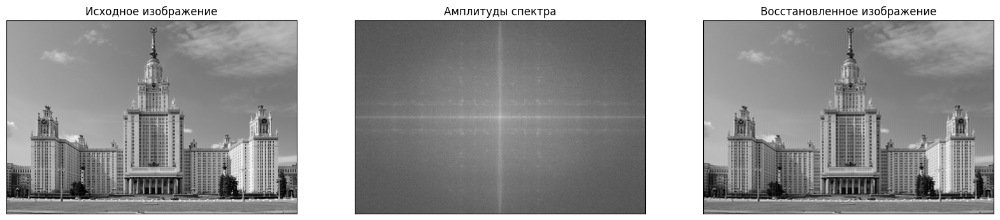

In [27]:
k = 120
img = cv.imread('msu.jpg', cv.IMREAD_GRAYSCALE)

_ = fft_transform(img, k, vis=True)

# Пример использования преобразования Фурье на датасете Cifar-10

[Из чего состоит Cifar-10](https://www.cs.toronto.edu/~kriz/cifar.html)

In [28]:
from torchvision.datasets import CIFAR10
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from PIL import ImageOps
from functools import partial
import time

In [29]:
data_train = CIFAR10("./", train=True, download=True)
data_test = CIFAR10("./", train=False, download=True)

Files already downloaded and verified
Files already downloaded and verified


In [30]:
def get_ml_dataset(data, transform=lambda x: x):
    X, y = [], []
    for i in range(len(data)):
        img, target = data[i]
        img_array = np.array(ImageOps.grayscale(img))
        img_array = transform(img_array)
        X.append(img_array)
        y.append(target)
    return np.array(X), np.array(y)

In [31]:
X_train, y_train = get_ml_dataset(data_train)
X_test, y_test = get_ml_dataset(data_test)
X_train.shape, X_test.shape

((50000, 32, 32), (10000, 32, 32))

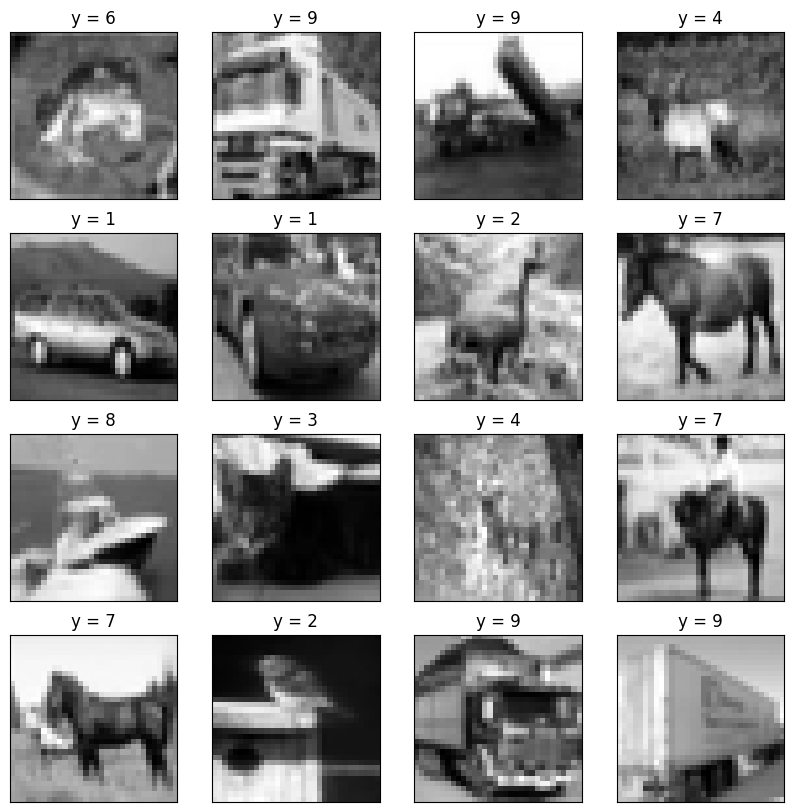

In [32]:
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4, 4, i + 1)
    plt.imshow(X_train[i], cmap="gray")
    plt.title(f"y = {y_train[i]}")
    plt.xticks([])
    plt.yticks([])
plt.show()

In [33]:
%%time
clf = LogisticRegression()
clf.fit(X_train.reshape(X_train.shape[0], -1), y_train)

CPU times: user 2min 1s, sys: 1min 38s, total: 3min 40s
Wall time: 19.3 s


/home/alexandr/miniconda3/envs/ml/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [34]:
def calc_accuracy(X, y):
    y_pred = clf.predict(X.reshape(X.shape[0], -1))
    return accuracy_score(y_pred, y)

In [35]:
score_train = calc_accuracy(X_train, y_train)
score_test = calc_accuracy(X_test, y_test)

print(f"train score\t = {score_train:0.4f}")
print(f"test score\t = {score_test:0.4f}")

train score	 = 0.3084
test score	 = 0.2882


===========k = 1===========
Размерность исходного пространства 	 = 1024
Размерность нового пространства 	 = 9


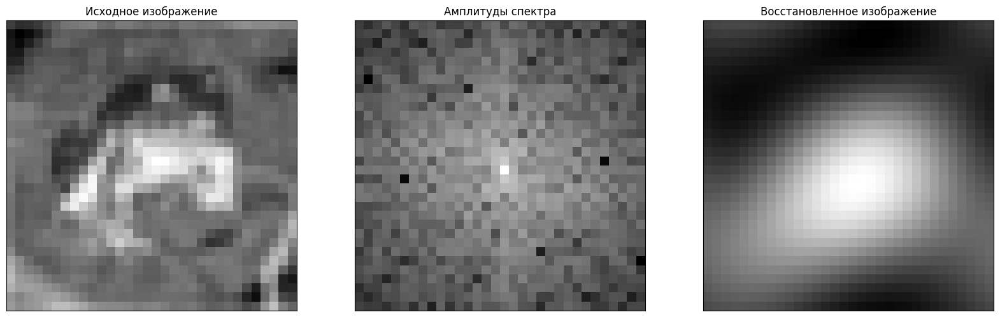

===========k = 5===========
Размерность исходного пространства 	 = 1024
Размерность нового пространства 	 = 121


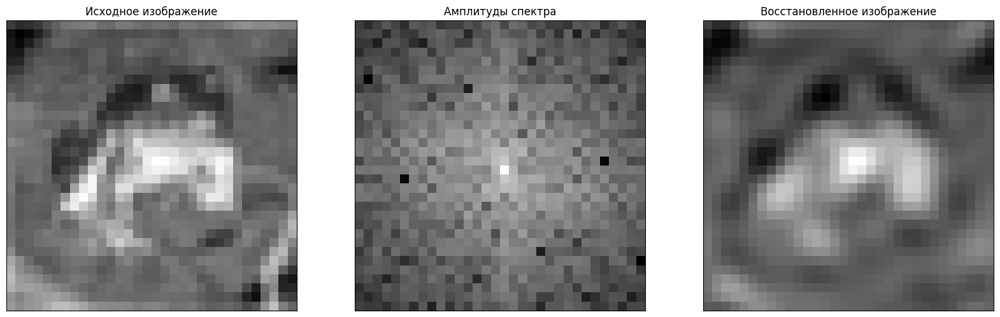

===========k = 10===========
Размерность исходного пространства 	 = 1024
Размерность нового пространства 	 = 441


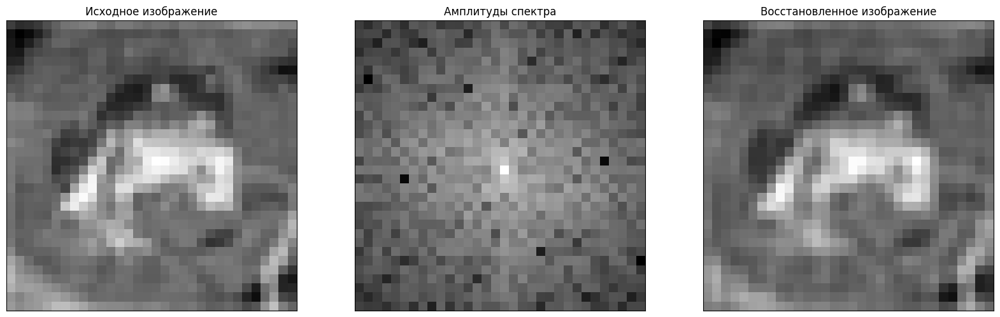

===========k = 14===========
Размерность исходного пространства 	 = 1024
Размерность нового пространства 	 = 841


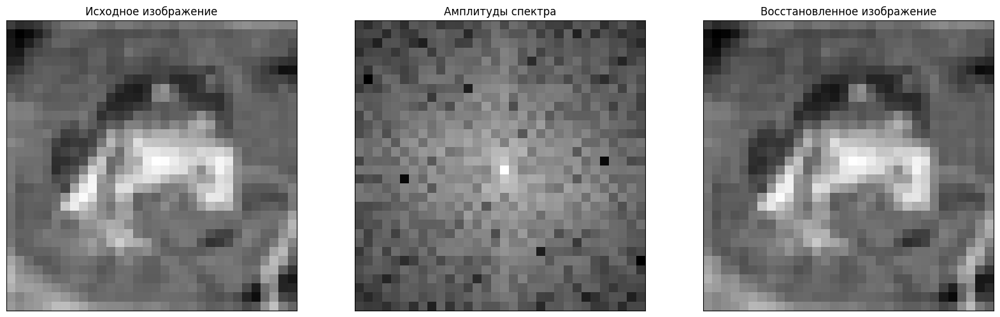

In [36]:
for k in [1, 5, 10, 14]:
    print(f"===========k = {k}===========")
    img = X_train[0]
    _ = fft_transform(img, k, vis=True)

In [37]:
for k in [1, 5, 10, 14]:
    print(f"===========k = {k}===========")
    fft_transform_k = partial(fft_transform, k=k)
    
    X_train, y_train = get_ml_dataset(data_train, fft_transform_k)
    X_test, y_test = get_ml_dataset(data_test, fft_transform_k)
    print(f"Размерность признаков \t\t= {X_train.shape[1] * X_train.shape[2]}")
    
    t_start = time.time()
    clf = LogisticRegression()
    clf.fit(X_train.reshape(X_train.shape[0], -1), y_train)
    t = time.time() - t_start
    print(f"Время обучения \t\t= {t}")
    
    score_train = calc_accuracy(X_train, y_train)
    score_test = calc_accuracy(X_test, y_test)

    print(f"train score\t\t = {score_train:0.4f}")
    print(f"test score\t\t = {score_test:0.4f}")

===========k = 1===========


/tmp/ipykernel_74138/714381105.py:10: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum = 20 * np.log(cv.magnitude(dft_shift[:,:,0], dft_shift[:,:,1]))


Размерность признаков 		= 9


/home/alexandr/miniconda3/envs/ml/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/tmp/ipykernel_74138/714381105.py:10: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum = 20 * np.log(cv.magnitude(dft_shift[:,:,0], dft_shift[:,:,1]))


Время обучения 		= 1.9261677265167236
train score		 = 0.1982
test score		 = 0.1945
===========k = 5===========
Размерность признаков 		= 121


/home/alexandr/miniconda3/envs/ml/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/tmp/ipykernel_74138/714381105.py:10: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum = 20 * np.log(cv.magnitude(dft_shift[:,:,0], dft_shift[:,:,1]))


Время обучения 		= 3.803295135498047
train score		 = 0.3094
test score		 = 0.3001
===========k = 10===========
Размерность признаков 		= 441


/home/alexandr/miniconda3/envs/ml/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/tmp/ipykernel_74138/714381105.py:10: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum = 20 * np.log(cv.magnitude(dft_shift[:,:,0], dft_shift[:,:,1]))


Время обучения 		= 7.613332986831665
train score		 = 0.3698
test score		 = 0.3536
===========k = 14===========
Размерность признаков 		= 841
Время обучения 		= 13.78765320777893
train score		 = 0.3909
test score		 = 0.3609


/home/alexandr/miniconda3/envs/ml/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


# Пирамиды изображений

[Пример из opencv](https://docs.opencv.org/4.x/dc/dff/tutorial_py_pyramids.html)

<img
src="https://production-media.paperswithcode.com/methods/2a9881dd-d953-4d3e-a417-09e1292938c9.png" style="float: right;" width=500>

<img
src="https://docs.opencv.org/4.x/orapple.jpg" style="float: left;" width=400>

(512, 512, 3)

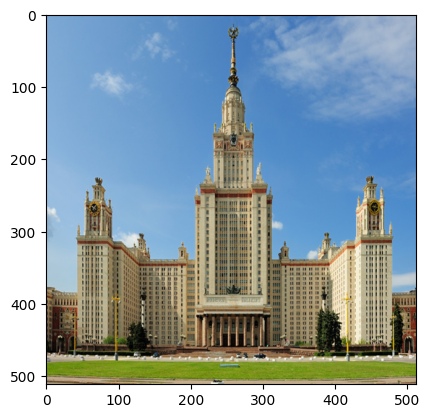

In [38]:
img = Image.open('msu.jpg').resize((512, 512))
img = np.array(img)
plt.imshow(img)
img.shape

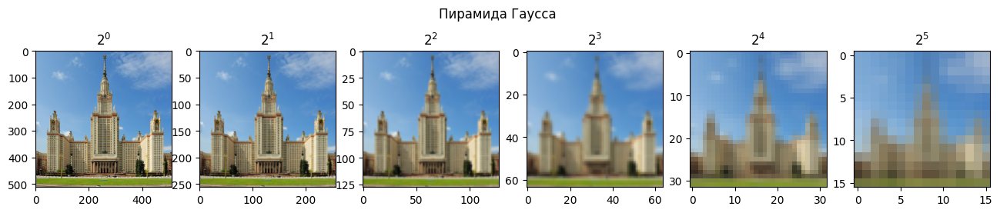

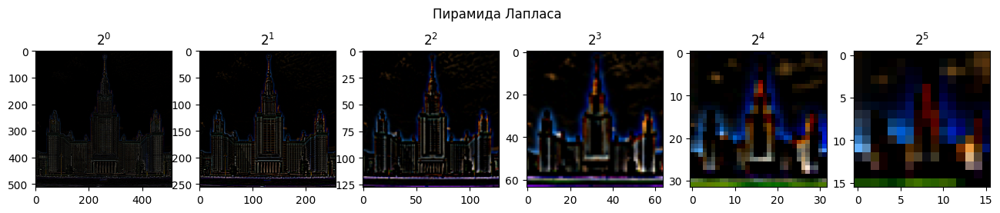

In [39]:
N = 6
G = img.copy()
gpA = [G]
for i in range(N):
    G = cv.pyrDown(G)
    gpA.append(G)

lpA = [gpA[N - 1]]
for i in range(N, 0, -1):
    GE = cv.pyrUp(gpA[i])
    L = cv.subtract(gpA[i-1], GE)
    lpA.append(L)


fig = plt.figure(figsize=(16, 3))
for i, G in enumerate(gpA[:-1]):
    plt.subplot(1, len(gpA) - 1, i+1)
    plt.imshow(G)
    plt.title(fr"$2^{i}$")
fig.suptitle("Пирамида Гаусса")
plt.show()

fig = plt.figure(figsize=(16, 3))
for i, L in enumerate(lpA[1:][::-1]):
    plt.subplot(1, len(lpA) - 1, i + 1)
    plt.imshow(L / np.max(L))
    plt.title(fr"$2^{i}$")
    
fig.suptitle("Пирамида Лапласа")
plt.show()

# Примеры использования обработки изображений


*   Предобработка входных изображений (Удаление шума, преобразование цветов)
*   Постобработка изображений (Удаление шумовых объектов, отверстий)
*   Выделение дополнительных признаков (Выделение важных объектов, областей)
*   Аугментация объектов (Преобразование объектов в ходе обучения/применения
модели)

<img src="https://scikit-image.org/docs/dev/_images/sphx_glr_plot_morphsnakes_001.png">

Хороший пример использования трансформаций: датасет MNIST

<img src="https://raw.githubusercontent.com/Yar4ik000/mmp_practicum_fall_2021/main/Seminars/Seminar%2004.%20Image%20processing%20and%20KNN/image_processing_src/images/mnist.png">

Класс изображения не меняется при:


*   сдвигах на 1-10 пикселей
*   поворотах на 10-15 градусов в каждую из сторон
*   размытии, удалении шумов

Добавив преобразованные объекты в исходную выборку, можно
существенно повысить качество

Часто используемые методы аугментации:
* отражение
* сдвиг
* поворот
* масштабирование (увеличение)
* добавление шума, размытие
* изменение яркости, контрастности, цветовой гаммы
* удаление части изображения